In [1]:
import pandas as pd
import geopandas as gpd
from shapely import geometry
from shapely.geometry import Polygon
import folium
from sentinelsat.sentinel import SentinelAPI
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from collections import Counter
import numpy as np
import skimage.transform
import cv2
import math
import zipfile
import rasterio
import os
from rasterio import plot
from rasterio.plot import show
from rasterio.mask import mask
import matplotlib.pyplot as plt

# visualise and sanity check our boundary using Folium.



In [2]:
def location(lon1, lon2, lat1, lat2):
    
    p1 = geometry.Point(lon1, lat1)
    p2 = geometry.Point(lon2, lat1)
    p3 = geometry.Point(lon2, lat2)
    p4 = geometry.Point(lon1, lat2)

    pointList = [p1, p2, p3, p4, p1]

    poly = geometry.Polygon([[p.x, p.y] for p in pointList])
    boundary = pd.DataFrame()
    boundary['geometry'] = [poly]
    boundary = gpd.GeoDataFrame(boundary, geometry='geometry', crs='EPSG:4326')
    return boundary

lon1 = 78.4
lon2 = 78.7
lat1 = 17.4
lat2 = 17.6

boundary = location(lon1, lon2, lat1, lat2)
m = folium.Map([(lat1+lat2)/2, (lon1+lon2)/2], zoom_start=13)
bound = folium.GeoJson(boundary, name='Boundary')
folium.Popup("Area of Interest").add_to(bound)
bound.add_to(m)
folium.LayerControl().add_to(m)

m

# Access the Data

In [3]:
# create boundary file
def location(lon1, lon2, lat1, lat2):
    p1 = geometry.Point(lon1, lat1)
    p2 = geometry.Point(lon2, lat1)
    p3 = geometry.Point(lon2, lat2)
    p4 = geometry.Point(lon1, lat2)

    pointList = [p1, p2, p3, p4, p1]

    poly = geometry.Polygon([[p.x, p.y] for p in pointList])
    boundary = pd.DataFrame()
    boundary['geometry'] = [poly]
    boundary = gpd.GeoDataFrame(boundary, geometry='geometry', crs='EPSG:4326')
    return boundary

lon1 = 78.4
lon2 = 78.7
lat1 = 17.4
lat2 = 17.6

boundary = location(lon1, lon2, lat1, lat2)

user = 'sai4444' 
password = 'S@i@@12345'
api = SentinelAPI(user, password, 'https://scihub.copernicus.eu/dhus')
geom = boundary['geometry'].iloc[0]
products = api.query(geom,
                     date=('20200809', '20210430'),
                     platformname='Sentinel-2',
                     processinglevel='Level-2A',
                     cloudcoverpercentage=(0, 20))

gdf = api.to_geodataframe(products)
gdf_sorted = gdf.sort_values(by='ingestiondate')

polya = boundary['geometry'].iloc[0]
gdf_sorted['contains'] = gdf_sorted['geometry'].apply(lambda x: x.contains(polya))
gdf_sorted = gdf_sorted[gdf_sorted['contains'] == True]
m = folium.Map([(lat1 + lat2) / 2, (lon1 + lon2) / 2], zoom_start=8)

bound = folium.GeoJson(boundary, name='Boundary')
folium.Popup("Area of Interest").add_to(bound)
bound.add_to(m)

for j, i in enumerate(gdf_sorted['geometry']):
    bound = folium.GeoJson(i, name='Sentinel_{}'.format(gdf_sorted['ingestiondate'].iloc[j]))
    bound.add_to(m)
folium.LayerControl().add_to(m)

m


# Lets download our selected images and crop them to fit our defined area.

# Our defined area

EPSG:32643


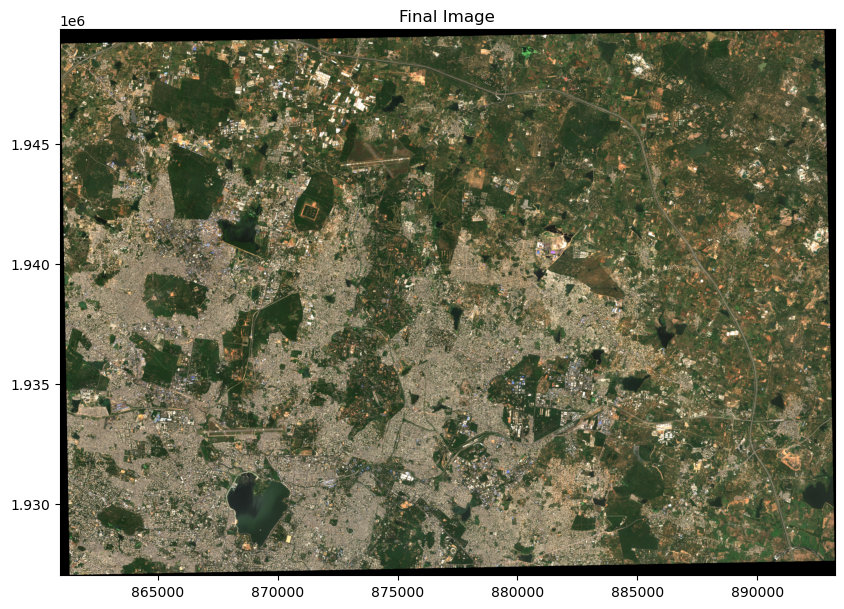

Output image saved as output_image.png


In [4]:
product_index = gdf_sorted.index[6]
filenames = []  

try:
    meta = api.get_product_odata(product_index)
    folder = meta['title']
    
    zip_file_path = '{}.zip'.format(folder)
    if not os.path.exists(zip_file_path):
        api.download(product_index)
    
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall('')
    
    folder = folder + '.SAFE'

    granule_dir = os.path.join(folder, 'GRANULE')
    granule_folder = os.listdir(granule_dir)[0]
    image_dir = os.path.join(granule_dir, granule_folder, 'IMG_DATA', 'R10m')
    raw_image = sorted(os.listdir(image_dir))[-2]
    image_path = os.path.join(image_dir, raw_image)

    check = rasterio.open(image_path)
    print(check.crs)

    bound_crs = boundary.to_crs(check.crs)

    with rasterio.open(image_path) as src:
        out_image, out_transform = mask(src, bound_crs.geometry, crop=True)
        out_meta = src.meta.copy()
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform
        })

    name = "StIves"
    date = "2020-12-24"
    filename = '{}_{}.png'.format(date, name)
    filenames.append(filename)
    with rasterio.open(filename, "w", **out_meta) as final:
        final.write(out_image)

    src = rasterio.open(filename)
    fig = plt.figure(figsize=(10, 10))
    plt.title('Final Image')
    plot.show(src, adjust='linear')

    plt.show()
    output_image_path = 'output_image.png'
    fig.savefig(output_image_path, dpi=300)
    print('Output image saved as', output_image_path)

except Exception as e:
    if "LTATriggered" in str(e):
        print("Product not available online. Skipping.")
    else:
        raise e


# Unsupervised change detection with PCA & K-Means


In [6]:
def rotate_image(image, angle):
    image_size = (image.shape[1], image.shape[0])
    image_center = tuple(np.array(image_size) / 2)

    rot_mat = np.vstack(
        [cv2.getRotationMatrix2D(image_center, angle, 1.0), [0, 0, 1]]
    )

    rot_mat_notranslate = np.matrix(rot_mat[0:2, 0:2])

    image_w2 = image_size[0] * 0.5
    image_h2 = image_size[1] * 0.5

    rotated_coords = [
        (np.array([-image_w2,  image_h2]) * rot_mat_notranslate).A[0],
        (np.array([ image_w2,  image_h2]) * rot_mat_notranslate).A[0],
        (np.array([-image_w2, -image_h2]) * rot_mat_notranslate).A[0],
        (np.array([ image_w2, -image_h2]) * rot_mat_notranslate).A[0]
    ]

    x_coords = [pt[0] for pt in rotated_coords]
    x_pos = [x for x in x_coords if x > 0]
    x_neg = [x for x in x_coords if x < 0]

    y_coords = [pt[1] for pt in rotated_coords]
    y_pos = [y for y in y_coords if y > 0]
    y_neg = [y for y in y_coords if y < 0]

    right_bound = max(x_pos)
    left_bound = min(x_neg)
    top_bound = max(y_pos)
    bot_bound = min(y_neg)

    new_w = int(abs(right_bound - left_bound))
    new_h = int(abs(top_bound - bot_bound))

    trans_mat = np.matrix([
        [1, 0, int(new_w * 0.5 - image_w2)],
        [0, 1, int(new_h * 0.5 - image_h2)],
        [0, 0, 1]
    ])
    affine_mat = (np.matrix(trans_mat) * np.matrix(rot_mat))[0:2, :]

    result = cv2.warpAffine(
        image,
        affine_mat,
        (new_w, new_h),
        flags=cv2.INTER_LINEAR
    )

    return result


def largest_rotated_rect(w, h, angle):
    quadrant = int(math.floor(angle / (math.pi / 2))) & 3
    sign_alpha = angle if ((quadrant & 1) == 0) else math.pi - angle
    alpha = (sign_alpha % math.pi + math.pi) % math.pi

    bb_w = w * math.cos(alpha) + h * math.sin(alpha)
    bb_h = w * math.sin(alpha) + h * math.cos(alpha)

    gamma = math.atan2(bb_w, bb_w) if (w < h) else math.atan2(bb_w, bb_w)

    delta = math.pi - alpha - gamma

    length = h if (w < h) else w

    d = length * math.cos(alpha)
    a = d * math.sin(alpha) / math.sin(delta)

    y = a * math.cos(gamma)
    x = y * math.tan(gamma)

    return (
        bb_w - 2 * x,
        bb_h - 2 * y
    )


def crop_around_center(image, width, height):
    image_size = (image.shape[1], image.shape[0])
    image_center = (int(image_size[0] * 0.5), int(image_size[1] * 0.5))

    if(width > image_size[0]):
        width = image_size[0]

    if(height > image_size[1]):
        height = image_size[1]

    x1 = int(image_center[0] - width * 0.5)
    x2 = int(image_center[0] + width * 0.5)
    y1 = int(image_center[1] - height * 0.5)
    y2 = int(image_center[1] + height * 0.5)

    return image[y1:y2, x1:x2]

def demo(imfile):
    image = cv2.imread(imfile)
    image_height, image_width = image.shape[0:2]

    print('file read')
    print('working...')
    for i in np.arange(0, 360, 0.5):
        image_rotated = rotate_image(image, i)
        image_rotated_cropped = crop_around_center(
            image_rotated,
            *largest_rotated_rect(
                image_width,
                image_height,
                math.radians(i)
            )
        )

        key = cv2.waitKey(2)
        if(key == ord("q") or key == 27):
            exit()
    
    cv2.imwrite(imfile, image_rotated_cropped)

    print("done")
    
for i in range(4):
    demo(filename)

file read
working...
done
file read
working...
done
file read
working...
done
file read
working...
done


In [10]:
import imageio
imagepath1 = '2020-12-24_StIves.png'
imagepath2 = '2020-12-24_StIves.png'

image1 = imageio.imread(imagepath1)
image2 = imageio.imread(imagepath2)
image1 = image1.astype(np.int16)
image2 = image2.astype(np.int16)
diff_image = abs(image1 - image2)

C:\Users\PC\AppData\Local\Temp\ipykernel_12840\3616819277.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image1 = imageio.imread(imagepath1)
C:\Users\PC\AppData\Local\Temp\ipykernel_12840\3616819277.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image2 = imageio.imread(imagepath2)


In [11]:
def find_vector_set(diff_image, new_size):
 
    i = 0
    j = 0
    vector_set = np.zeros((int(new_size[0] * new_size[1] / 75), 75))
    while i < vector_set.shape[0]:
        while j < new_size[0]:
            k = 0
            while k < new_size[1]:
                block   = diff_image[j:j+5, k:k+5]
                feature = block.ravel()
                vector_set[i, :] = feature
                k = k + 5
            j = j + 5
        i = i + 1
 
    mean_vec   = np.mean(vector_set, axis = 0)
    vector_set = vector_set - mean_vec
    return vector_set, mean_vec
 
def find_FVS(EVS, diff_image, mean_vec, new):
 
    i = 2
    feature_vector_set = []
 
    while i < new[0] - 2:
        j = 2
        while j < new[1] - 2:
            block = diff_image[i-2:i+3, j-2:j+3]
            feature = block.flatten()
            feature_vector_set.append(feature)
            j = j+1
        i = i+1
 
    FVS = np.dot(feature_vector_set, EVS)
    FVS = FVS - mean_vec
    print("\nfeature vector space size", FVS.shape)
    return FVS
 
def clustering(FVS, components, new):
 
    kmeans = KMeans(components, verbose = 0)
    kmeans.fit(FVS)
    output = kmeans.predict(FVS)
    count  = Counter(output)
 
    least_index = min(count, key = count.get)
    change_map  = np.reshape(output,(new[0] - 4, new[1] - 4))
    return least_index, change_map
 
def find_PCAKmeans(imagepath1, imagepath2):
 
    image1 = imageio.imread(imagepath1)
    image2 = imageio.imread(imagepath2)
 
    new_size = np.asarray(image1.shape) 
    new_size = np.where(np.isinf(new_size), 0, new_size)  # Replace infinity with 0
    new_size = new_size.astype(int) * 5
    image1 = skimage.transform.resize(image1, new_size).astype(np.int16)
    image2 = skimage.transform.resize(image2, new_size).astype(np.int16)
    image1 = image1.astype(np.int16)
    image2 = image2.astype(np.int16)
    
    diff_image = abs(image1 - image2)
    vector_set, mean_vec = find_vector_set(diff_image, new_size)
    pca     = PCA()
    pca.fit(vector_set)
    EVS = pca.components_
 
    FVS     = find_FVS(EVS, diff_image, mean_vec, new_size)
    components = 2
    least_index, change_map = clustering(FVS, components, new_size)
 
    change_map[change_map == least_index] = 255
    change_map[change_map != 255] = 0
 
    change_map = change_map.astype(np.uint8)
    kernel     = np.asarray(((0,1,1,1,0),
                             (1,1,1,1,0),
                             (1,1,1,1,1),
                             (1,1,1,1,1),
                             (0,1,1,1,0)), dtype=np.uint8)
    cleanChangeMap = cv2.erode(change_map,kernel)
    imageio.imwrite("{}_{}_diff.png".format(imagepath1[:-4],imagepath2[:-4]), cleanChangeMap)


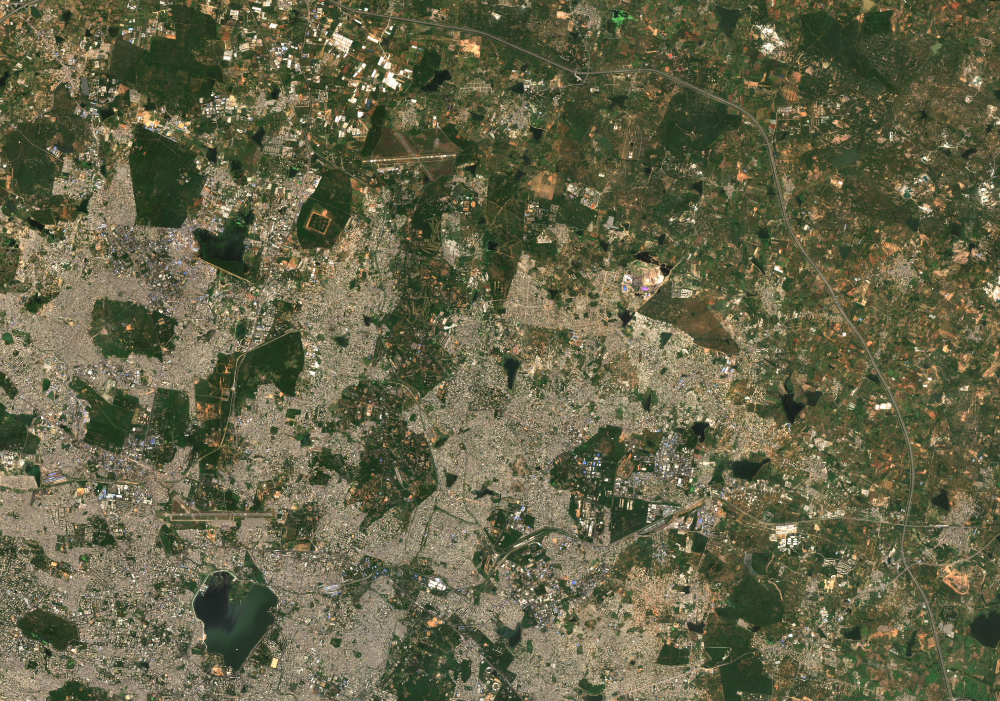

In [9]:
m = folium.Map(location=[17.5, 78.55], zoom_start=10)

image_url = '2020-12-24_StIves.png'
image = folium.raster_layers.ImageOverlay(
    name='Base Image',
    image=image_url,
    bounds=[[17.4, 78.4], [17.6, 78.7]],
    opacity=0.6,
    interactive=True,
    cross_origin=False,
    zindex=1
)
image.add_to(m)

marker = folium.Marker(
    location=[17.45, 78.55],
    popup='Marker Popup',
    icon=folium.Icon(color='red', icon='info-sign')
)
marker.add_to(m)

polygon_coordinates = [[17.4, 78.4], [17.6, 78.4], [17.6, 78.7], [17.4, 78.7]]
polygon = folium.vector_layers.Polygon(
    locations=polygon_coordinates,
    fill_color='green',
    fill_opacity=0.5,
    popup='Polygon Popup'
)
polygon.add_to(m)

m
